# GPT-Image-2 on Microsoft Foundry - Part 1

## Text to image

<img src="https://techcommunity.microsoft.com/t5/s/gxcuf89792/images/bS00NTAwNTcxLTZ4WmdLeQ?revision=9&image-dimensions=2000x2000&constrain-image=true">

GPT‑image‑2 is now generally available in Microsoft Foundry, bringing enterprise‑grade image generation with significantly improved quality, control, and scalability for production workflows.

> https://techcommunity.microsoft.com/blog/azure-ai-foundry-blog/introducing-openais-gpt-image-2-in-microsoft-foundry/4500571


In [1]:
import base64
import json
import math
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import os
import requests
import shutil
import sys
import time

from azure.identity import DefaultAzureCredential, get_bearer_token_provider
from datetime import datetime
from dotenv import load_dotenv
from io import BytesIO
from IPython.display import FileLink, display, HTML
from math import gcd
from openai import AzureOpenAI
from pathlib import Path
from PIL import Image, ImageDraw
from typing import Optional, Literal

In [2]:
sys.version

'3.10.19 (main, Oct 21 2025, 16:43:05) [GCC 11.2.0]'

In [3]:
print(f"Today is {datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 24-Apr-2026 10:00:07


## 1. Settings

In [4]:
load_dotenv("azure.env")

ENDPOINT = os.getenv("ENDPOINT")

In [5]:
DEPLOYMENT = "gpt-image-2"
API_VERSION: str = "2024-10-21"

MIN_PIXELS: int = 655_360
MAX_PIXELS: int = 8_294_400
DIM_ALIGNMENT: int = 16

USE_ENTRA_ID = True

In [6]:
OUTPUT_DIR = "images"

if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)

os.makedirs(OUTPUT_DIR, exist_ok=True)

## 2. Helper

In [8]:
def build_client():
    """Build an AzureOpenAI client for gpt-image-2.

    Uses Entra ID (DefaultAzureCredential) when no API key is set in the
    environment; otherwise falls back to API key authentication.

    Returns
    -------
    AzureOpenAI
        Configured Azure OpenAI SDK client.
    """
    if USE_ENTRA_ID:
        token_provider = get_bearer_token_provider(
            DefaultAzureCredential(),
            "https://cognitiveservices.azure.com/.default",
        )
        return AzureOpenAI(
            azure_endpoint=ENDPOINT,
            azure_ad_token_provider=token_provider,
            api_version=API_VERSION,
        )

    return AzureOpenAI(
        azure_endpoint=ENDPOINT,
        api_key=os.environ["AZURE_OPENAI_API_KEY"],
        api_version=API_VERSION,
    )

In [9]:
def validate_dimensions(width: int, height: int) -> dict[str, object]:
    """Validate a (width, height) pair against gpt-image-2 constraints.

    The service enforces three rules on custom resolutions:
      * Each dimension must be a multiple of 16.
      * Total pixel count must be >= 655,360.
      * Total pixel count must be <= 8,294,400.

    Parameters
    ----------
    width : int
        Image width in pixels.
    height : int
        Image height in pixels.

    Returns
    -------
    dict[str, object]
        Keys: valid (bool), pixels (int), megapixels (float),
        aspect_ratio (str), issues (list[str]).
    """
    pixels = width * height
    issues: list[str] = []

    if width % DIM_ALIGNMENT != 0:
        issues.append(f"Width {width} is not a multiple of {DIM_ALIGNMENT}")

    if height % DIM_ALIGNMENT != 0:
        issues.append(f"Height {height} is not a multiple of {DIM_ALIGNMENT}")

    if pixels < MIN_PIXELS:
        issues.append(f"Pixel count {pixels:,} below minimum {MIN_PIXELS:,}")

    if pixels > MAX_PIXELS:
        issues.append(f"Pixel count {pixels:,} above maximum {MAX_PIXELS:,} "
                      "(service will auto-resize)")

    # Simple aspect ratio
    g = gcd(width, height)
    aspect = f"{width // g}:{height // g}"

    return {
        "valid": len([i for i in issues if "auto-resize" not in i]) == 0,
        "pixels": pixels,
        "megapixels": round(pixels / 1_000_000, 2),
        "aspect_ratio": aspect,
        "issues": issues,
    }

In [10]:
def snap_to_16(value: int) -> int:
    """Round a dimension down to the nearest multiple of 16.

    Parameters
    ----------
    value : int
        Desired dimension.

    Returns
    -------
    int
        Largest multiple of 16 that is <= value.
    """
    return (value // DIM_ALIGNMENT) * DIM_ALIGNMENT

In [11]:
test_sizes: list[tuple[int, int, str]] = [
    (1024, 1024, "Square (preset)"),
    (1536, 1024, "Landscape (preset)"),
    (1024, 1536, "Portrait (preset)"),
    (3840, 2160, "4K UHD 16:9"),
    (2048, 2048, "2K square"),
    (1920, 1080, "Full HD"),
    (1000, 1000, "Not multiple of 16"),
    (5000, 5000, "Exceeds pixel budget"),
]

print(f"{'Size':<14} {'AR':<8} {'MP':<6} {'Valid':<6} Notes")
print("-" * 80)
for w, h, label in test_sizes:
    r = validate_dimensions(w, h)
    size_str = f"{w}x{h}"
    valid = "✓" if r["valid"] else "✗"
    notes = "; ".join(r["issues"]) if r["issues"] else label
    print(
        f"{size_str:<14} {r['aspect_ratio']:<8} {r['megapixels']:<6} {valid:<6} {notes}"
    )

Size           AR       MP     Valid  Notes
--------------------------------------------------------------------------------
1024x1024      1:1      1.05   ✓      Square (preset)
1536x1024      3:2      1.57   ✓      Landscape (preset)
1024x1536      2:3      1.57   ✓      Portrait (preset)
3840x2160      16:9     8.29   ✓      4K UHD 16:9
2048x2048      1:1      4.19   ✓      2K square
1920x1080      16:9     2.07   ✗      Height 1080 is not a multiple of 16
1000x1000      1:1      1.0    ✗      Width 1000 is not a multiple of 16; Height 1000 is not a multiple of 16
5000x5000      1:1      25.0   ✗      Width 5000 is not a multiple of 16; Height 5000 is not a multiple of 16; Pixel count 25,000,000 above maximum 8,294,400 (service will auto-resize)


In [12]:
def b64_to_pil(b64_string: str) -> Image.Image:
    """Decode a base64-encoded image to a PIL Image.

    Parameters
    ----------
    b64_string : str
        Base64-encoded image payload.

    Returns
    -------
    Image.Image
        Decoded PIL image.
    """
    return Image.open(BytesIO(base64.b64decode(b64_string)))

In [13]:
def save_image(
    img: Image.Image,
    prefix: str = "image",
    fmt: str = "PNG",
) -> Path:
    """Save a PIL image to the output directory with a timestamped filename.

    Parameters
    ----------
    img : Image.Image
        Image to persist.
    prefix : str
        Filename prefix.
    fmt : str
        PIL format string ('PNG' or 'JPEG').

    Returns
    -------
    Path
        Absolute path to the saved file.
    """
    today = datetime.now().strftime("%Y%m%d_%H%M%S")
    image_filepath = os.path.join(
        OUTPUT_DIR, f"{prefix}_{today}.{fmt.lower()}")
    img.save(image_filepath, format=fmt)
    print(f"✅ Image saved in '{image_filepath}'")
    !ls $image_filepath -lh

    return image_filepath

In [14]:
def display_images(
    images: list[Image.Image],
    titles: Optional[list[str]] = None,
    cols: int = 3,
    fig_width: int = 18,
) -> None:
    """Display a grid of PIL images.

    Parameters
    ----------
    images : list[Image.Image]
        Images to display.
    titles : list[str] | None
        Optional per-image captions.
    cols : int
        Number of columns.
    fig_width : int
        Total figure width in inches.
    """
    n = len(images)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows,
                             cols,
                             figsize=(fig_width, fig_width * rows // cols))
    axes = np.array(axes).flatten()

    for i, ax in enumerate(axes):
        if i < n:
            ax.imshow(images[i])
            ax.axis("off")
            if titles:
                ax.set_title(titles[i], fontsize=12, wrap=True)
        else:
            ax.set_visible(False)

    plt.tight_layout()
    plt.show()

In [15]:
def _auth_headers() -> dict[str, str]:
    """Build request headers with the correct auth scheme.

    Returns
    -------
    dict[str, str]
        HTTP headers including auth.
    """
    headers: dict[str, str] = {"Content-Type": "application/json"}

    if USE_ENTRA_ID:
        cred = DefaultAzureCredential()
        token = cred.get_token("https://cognitiveservices.azure.com/.default")
        headers["Authorization"] = f"Bearer {token.token}"

    else:
        headers["Api-Key"] = os.environ["AZURE_OPENAI_API_KEY"]

    return headers

In [16]:
def generate_image(
    prompt: str,
    size: Optional[str] = "1024x1024",
    quality: str = "high",
    n: int = 1,
    output_format: str = "png",
    output_compression: Optional[int] = None,
    extra: Optional[dict] = None,
) -> tuple[list[Image.Image], dict]:
    """Generate images with gpt-image-2 via the REST API.

    Parameters
    ----------
    prompt : str
        Natural-language description.
    size : str | None
        Resolution. Accepts presets ('1024x1024', '1536x1024', '1024x1536', '4K')
        or a custom WxH string where each side is a multiple of 16. Pass None to
        let the intelligent routing layer choose.
    quality : str
        'low', 'medium', or 'high'.
    n : int
        Number of images (1–10).
    output_format : str
        'png' or 'jpeg'.
    output_compression : int | None
        0–100 (JPEG only).
    extra : dict | None
        Additional request-body fields (e.g. routing mode parameters).

    Returns
    -------
    tuple[list[Image.Image], dict]
        Decoded PIL images and the raw JSON response.
    """
    url = (f"{ENDPOINT.rstrip('/')}/openai/deployments/{DEPLOYMENT}"
           f"/images/generations?api-version={API_VERSION}")

    payload: dict = {
        "prompt": prompt,
        "n": n,
        "quality": quality,
        "output_format": output_format,
    }

    if size is not None:
        payload["size"] = size

    if output_compression is not None:
        payload["output_compression"] = output_compression

    if extra:
        payload.update(extra)

    start = time.time()

    resp = requests.post(url,
                         headers=_auth_headers(),
                         json=payload,
                         timeout=600)

    minutes, seconds = divmod((time.time() - start), 60)
    elapsed_txt = f"{minutes:.0f} minutes and {seconds:.0f} seconds"

    if not resp.ok:
        print(f"HTTP {resp.status_code}: {resp.text}")
        resp.raise_for_status()

    data = resp.json()
    print(f"✅ Generated {len(data['data'])} image(s) in {elapsed_txt}")

    if "usage" in data:
        print("Usage:", json.dumps(data["usage"], indent=2))

    images = [b64_to_pil(item["b64_json"]) for item in data["data"]]
    return images, data

## 3. Text to image examples

### Client

In [17]:
client = build_client()

### Example 1

Prompt is: 'Photorealistic interior of a Paris Métro Line 4 subway car, completely empty, no people. Wide-angle perspective from one end of the car looking down the central aisle. Dual rows of flip-up french flag colors fabric seats along both sides, vertical steel grab poles, overhead horizontal grab bars, rubber floor mattering in dark grey. Above the windows: a continuous route map strip for Ligne 4 (Bagneux Lucie Aubrac – Porte de Clignancourt) and rectangular advertising frames with generic posters. Fluorescent lighting with a cool, slightly bluish-white tone reflecting off the white ceiling panels. Through the windows, the tiled station wall reads 'Porte d'Orléans' in the classic RATP white-on-dark-blue enamel lettering style. No motion blur. Crisp, detailed, high fidelity. Shot on a wide-angle lens.'

✅ Generated 1 image(s) in 1 minutes and 15 seconds
Usage: {
  "input_tokens": 180,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 180
  },
  "output_tokens":

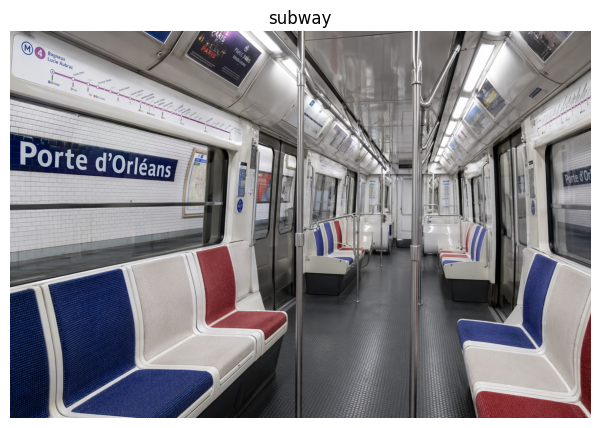

✅ Image saved in 'images/subway_20260424_100123.png'
-rwxrwxrwx 1 root root 2.6M Apr 24 10:01 images/subway_20260424_100123.png
🖼️ Image dimensions: (1536, 1024)


In [18]:
prompt = (
    "Photorealistic interior of a Paris Métro Line 4 subway car, completely empty, no people. "
    "Wide-angle perspective from one end of the car looking down the central aisle. "
    "Dual rows of flip-up french flag colors fabric seats along both sides, vertical steel grab poles, "
    "overhead horizontal grab bars, rubber floor mattering in dark grey. "
    "Above the windows: a continuous route map strip for Ligne 4 (Bagneux Lucie Aubrac – Porte de Clignancourt) "
    "and rectangular advertising frames with generic posters. "
    "Fluorescent lighting with a cool, slightly bluish-white tone reflecting off the white ceiling panels. "
    "Through the windows, the tiled station wall reads 'Porte d'Orléans' in the classic RATP "
    "white-on-dark-blue enamel lettering style. "
    "No motion blur. Crisp, detailed, high fidelity. Shot on a wide-angle lens."
)

print(f"Prompt is: '{prompt}'\n")

images, raw = generate_image(
    prompt,
    size="1536x1024",
    quality="medium",
)

display_images(images, titles=["subway"])

image_file = save_image(images[0], prefix="subway")
print(f"🖼️ Image dimensions: {images[0].size}")

In [19]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/subway_20260424_100123.png

### Example 2

Prompt is: 'Photorealistic of Avenue de l'Opéra in Paris, circa 1920. The opera should be in the background.'

✅ Generated 1 image(s) in 4 minutes and 22 seconds
Usage: {
  "input_tokens": 33,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 33
  },
  "output_tokens": 3171,
  "total_tokens": 3204
}


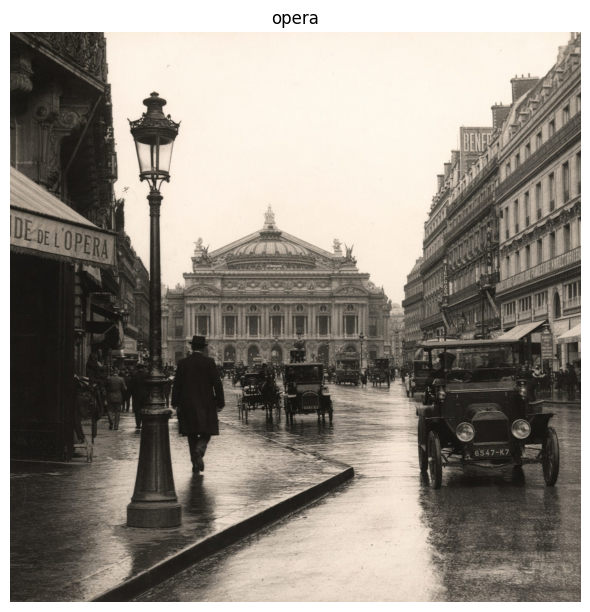

✅ Image saved in 'images/opera_20260424_100548.png'
-rwxrwxrwx 1 root root 1.7M Apr 24 10:05 images/opera_20260424_100548.png
🖼️ Image dimensions: (1024, 1024)


In [20]:
prompt = (
    "Photorealistic of Avenue de l'Opéra in Paris, circa 1920. "
    "The opera should be in the background."
)

print(f"Prompt is: '{prompt}'\n")

images, raw = generate_image(
    prompt,
    size="1024x1024",
    quality="high",
)

display_images(images, titles=["opera"])

image_file = save_image(images[0], prefix="opera")
print(f"🖼️ Image dimensions: {images[0].size}")

In [21]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/opera_20260424_100548.png

### Example 3

Prompt is: 'Generate a page of a comic book in the style of a Japanese manga.'

✅ Generated 1 image(s) in 4 minutes and 21 seconds
Usage: {
  "input_tokens": 21,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 21
  },
  "output_tokens": 4534,
  "total_tokens": 4555
}


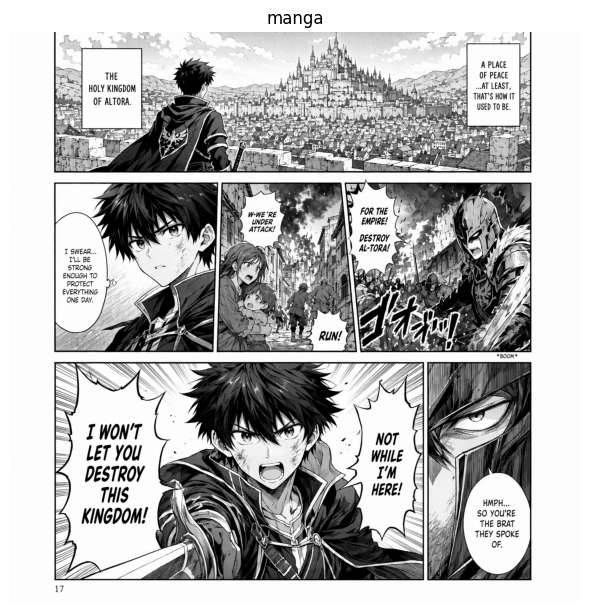

✅ Image saved in 'images/manga_20260424_101011.png'
-rwxrwxrwx 1 root root 3.4M Apr 24 10:10 images/manga_20260424_101011.png
🖼️ Image dimensions: (1536, 1536)


In [22]:
prompt = "Generate a page of a comic book in the style of a Japanese manga."

print(f"Prompt is: '{prompt}'\n")

images, raw = generate_image(
    prompt,
    size="1536x1536",
    quality="high",
)

display_images(images, titles=["manga"])

image_file = save_image(images[0], prefix="manga")
print(f"🖼️ Image dimensions: {images[0].size}")

In [23]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/manga_20260424_101011.png

### Example 4

Prompt is: 'Create a realistic picture of a 50 years old French male. His complexion should be advanced. The hair is a dark shade. He should wear a white shirt with a blue tie. Set him against a picturesque backdrop of Paris.'

✅ Generated 1 image(s) in 2 minutes and 52 seconds
Usage: {
  "input_tokens": 52,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 52
  },
  "output_tokens": 5546,
  "total_tokens": 5598
}


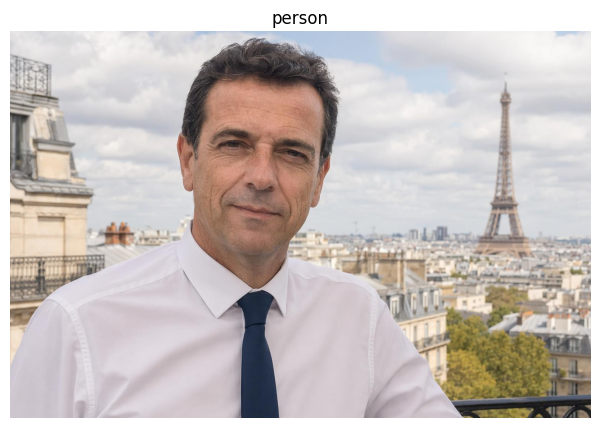

✅ Image saved in 'images/person_20260424_101307.jpeg'
-rwxrwxrwx 1 root root 125K Apr 24 10:13 images/person_20260424_101307.jpeg
🖼️ Image dimensions: (1536, 1024)


In [24]:
prompt = (
    "Create a realistic picture of a 50 years old French male. "
    "His complexion should be advanced. The hair is a dark shade. He should wear a white shirt with a blue tie. "
    "Set him against a picturesque backdrop of Paris."
)

print(f"Prompt is: '{prompt}'\n")

# Using jpeg output with no compression
images, raw = generate_image(
    prompt,
    size="1536x1024",
    quality="high",
    output_format="jpeg",
    output_compression=100,  # from 0 to 100. 100 is no compression, 0 is high compression
)

display_images(images, titles=["person"])

image_file = save_image(images[0], prefix="person", fmt='JPEG')
print(f"🖼️ Image dimensions: {images[0].size}")

In [25]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/person_20260424_101307.jpeg

### Example 5

Prompt is: 'Modern pencil illustration of Vintage travel poster illustration of the French Côte d'Azur, France, panoramic coastal cliff road scene, classic 1960s white car driving along a curved seaside road, deep blue Mediterranean sea with small sailboats, colorful pastel hillside village, bright blue sky with soft clouds, lemon tree branches with vibrant yellow lemons framing the foreground, warm summer sunlight, bold vibrant colors, retro 1950s travel poster style, cinematic composition, high detail, screen print texture, graphic illustration. Hand-drawn style, illustration with loose strokes and defined contours. High-contrast color palette, maintaining chromatic harmony between background and elements. Contemporary and decorative aesthetic.'

✅ Generated 1 image(s) in 4 minutes and 3 seconds
Usage: {
  "input_tokens": 139,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 139
  },
  "output_tokens": 3171,
  "total_tokens": 3310
}


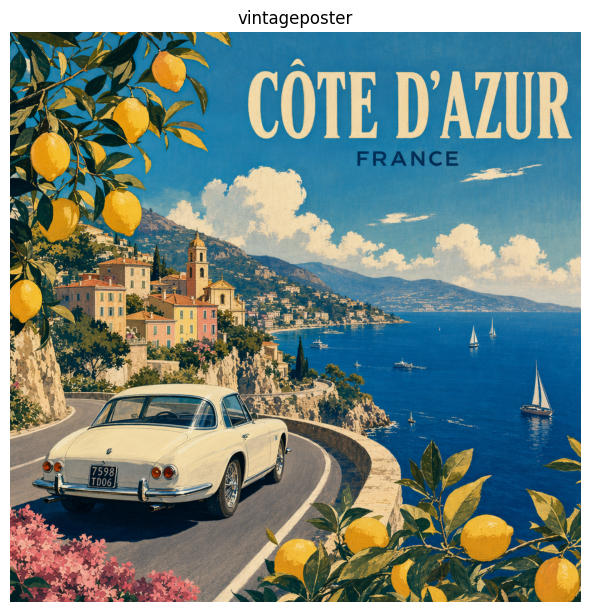

✅ Image saved in 'images/vintageposter_20260424_101711.png'
-rwxrwxrwx 1 root root 1.9M Apr 24 10:17 images/vintageposter_20260424_101711.png
🖼️ Image dimensions: (1024, 1024)


In [26]:
prompt = (
    "Modern pencil illustration of Vintage travel poster illustration of the French Côte d'Azur, France, panoramic coastal cliff road scene, "
    "classic 1960s white car driving along a curved seaside road, deep blue Mediterranean sea with small sailboats, colorful pastel hillside "
    "village, bright blue sky with soft clouds, lemon tree branches with vibrant yellow lemons framing the foreground, "
    "warm summer sunlight, bold vibrant colors, retro 1950s travel poster style, cinematic composition, high detail, screen print texture, "
    "graphic illustration. Hand-drawn style, illustration with loose strokes and defined contours. High-contrast color palette, maintaining "
    "chromatic harmony between background and elements. Contemporary and decorative aesthetic."
)

print(f"Prompt is: '{prompt}'\n")

images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["vintageposter"])

image_file = save_image(images[0], prefix="vintageposter")
print(f"🖼️ Image dimensions: {images[0].size}")

In [27]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/vintageposter_20260424_101711.png

### Example 6

Prompt is: 'Use GPT-image-2 to analyze this palm and generate a detailed reading. Analyze the life line, head line, heart line, fate line, sun line, wealth line, and marriage line, including their shape, darkness, branching, and starting and ending points. Compile the results into a high-quality fortune-telling report with a focus on providing advice.'

✅ Generated 1 image(s) in 1 minutes and 9 seconds
Usage: {
  "input_tokens": 77,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 77
  },
  "output_tokens": 358,
  "total_tokens": 435
}


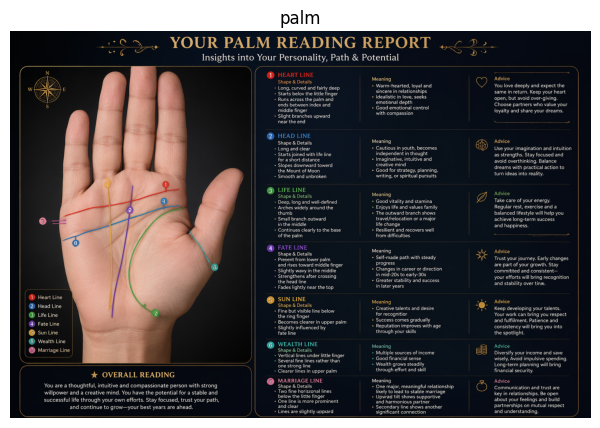

✅ Image saved in 'images/palm_20260424_101822.png'
-rwxrwxrwx 1 root root 1.8M Apr 24 10:18 images/palm_20260424_101822.png
🖼️ Image dimensions: (1536, 1024)


In [28]:
prompt = (
    "Use GPT-image-2 to analyze this palm and generate a detailed reading. "
    "Analyze the life line, head line, heart line, fate line, sun line, wealth line, and marriage line, including their shape, "
    "darkness, branching, and starting and ending points. "
    "Compile the results into a high-quality fortune-telling report with a focus on providing advice."
)

print(f"Prompt is: '{prompt}'\n")

# Using quality = low
images, raw = generate_image(prompt, size="1536x1024", quality="low")

display_images(images, titles=["palm"])

image_file = save_image(images[0], prefix="palm")
print(f"🖼️ Image dimensions: {images[0].size}")

In [29]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/palm_20260424_101822.png

### Example 7

Prompt is: 'A hyper-realistic medium shot of a beautiful woman standing Slightly sideways  in front of the Notre-Dame Cathedral in Paris during a heavy snowfall. She is wearing a thick black wool coat and a luxury grey Louis Vuitton monogram scarf draped over her head like a hood, with white fringed edges visible. The cathedral's gothic architecture, including the rose window and stone statues, is visible in the background, partially covered in snow. Cinematic soft lighting, snowflakes drifting in the air, winter aesthetic, cold atmosphere, muted color palette (black, grey, white, and beige stone). High detail, 4k resolution, photorealistic texture on the wool and scarf fabric'

✅ Generated 1 image(s) in 3 minutes and 18 seconds
Usage: {
  "input_tokens": 144,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 144
  },
  "output_tokens": 5574,
  "total_tokens": 5718
}


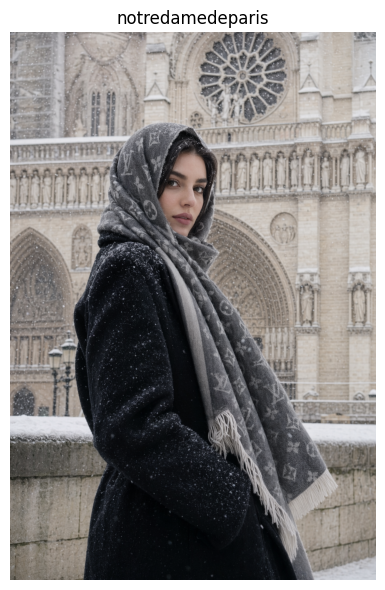

✅ Image saved in 'images/notredamedeparis_20260424_102144.png'
-rwxrwxrwx 1 root root 2.4M Apr 24 10:21 images/notredamedeparis_20260424_102144.png
🖼️ Image dimensions: (1024, 1536)


In [30]:
prompt = (
    "A hyper-realistic medium shot of a beautiful woman standing Slightly sideways  in front of the Notre-Dame Cathedral in Paris "
    "during a heavy snowfall. She is wearing a thick black wool coat and a luxury grey Louis Vuitton monogram scarf draped over "
    "her head like a hood, with white fringed edges visible. The cathedral's gothic architecture, including the rose window and stone statues, "
    "is visible in the background, partially covered in snow. Cinematic soft lighting, snowflakes drifting in the air, winter aesthetic, "
    "cold atmosphere, muted color palette (black, grey, white, and beige stone). High detail, 4k resolution, photorealistic texture on the wool "
    "and scarf fabric")

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1536", quality="high")

display_images(images, titles=["notredamedeparis"])

image_file = save_image(images[0], prefix="notredamedeparis")
print(f"🖼️ Image dimensions: {images[0].size}")

In [31]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/notredamedeparis_20260424_102144.png

### Example 8

Prompt is: 'A microscopic, photo-realistic conceptual flowchart of a sulfuric acid reaction. Starting with vivid yellow sulfur crystals, the process transitions through glowing energy arrows into a dense white mist, finally condensing into a heavy, highly viscous droplet of clear acid within a high-end glass beaker. Cinematographic lighting, deep macro depth of field, sharp focus on the texture of the chemical substance, a deep, dark background, and a high-end scientific journal illustration style.'

✅ Generated 1 image(s) in 3 minutes and 0 seconds
Usage: {
  "input_tokens": 101,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 101
  },
  "output_tokens": 5574,
  "total_tokens": 5675
}


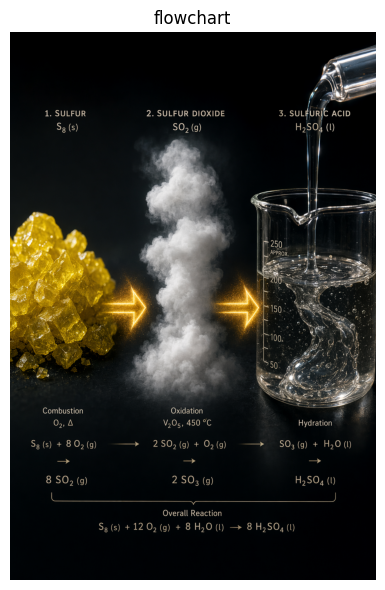

✅ Image saved in 'images/flowchart_20260424_102447.png'
-rwxrwxrwx 1 root root 1.8M Apr 24 10:24 images/flowchart_20260424_102447.png
🖼️ Image dimensions: (1024, 1536)


In [32]:
prompt = (
    "A microscopic, photo-realistic conceptual flowchart of a sulfuric acid reaction. "
    "Starting with vivid yellow sulfur crystals, the process transitions through glowing energy arrows into a dense white mist, "
    "finally condensing into a heavy, highly viscous droplet of clear acid within a high-end glass beaker. "
    "Cinematographic lighting, deep macro depth of field, sharp focus on the texture of the chemical substance, a deep, dark background, "
    "and a high-end scientific journal illustration style.")

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1536", quality="high")

display_images(images, titles=["flowchart"])

image_file = save_image(images[0], prefix="flowchart")
print(f"🖼️ Image dimensions: {images[0].size}")

In [33]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/flowchart_20260424_102447.png

### Example 9

Prompt is: 'iPhone 17 Pro mockup showing a meditation app dashboard, dark mode, large blurred green circle 'BREATHE' button, daily streak '12 days', bottom tab bar with 4 icons. I want this text on the top of this app : 'Good evening Serge!''

✅ Generated 1 image(s) in 3 minutes and 18 seconds
Usage: {
  "input_tokens": 63,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 63
  },
  "output_tokens": 5574,
  "total_tokens": 5637
}


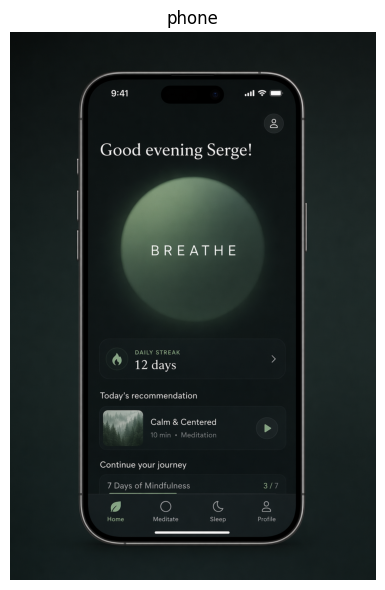

✅ Image saved in 'images/phone_20260424_102807.png'
-rwxrwxrwx 1 root root 1.5M Apr 24 10:28 images/phone_20260424_102807.png
🖼️ Image dimensions: (1024, 1536)


In [34]:
prompt = (
    "iPhone 17 Pro mockup showing a meditation app dashboard, dark mode, "
    "large blurred green circle 'BREATHE' button, daily streak '12 days', "
    "bottom tab bar with 4 icons. "
    "I want this text on the top of this app : 'Good evening Serge!'"
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1536", quality="high")

display_images(images, titles=["phone"])

image_file = save_image(images[0], prefix="phone")
print(f"🖼️ Image dimensions: {images[0].size}")

In [35]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/phone_20260424_102807.png

### Example 10

Prompt is: 'Amateur photo of an open notebook lying flat, filled with handwritten notes in black ballpoint pen. The handwriting is casual and slightly messy, like personnal notes, natural imperfections, crossed out words, underlined headings. Shot from slightly above, natural daylight from a window, no flash. Casual desk setting, shot on iPhone.'

✅ Generated 1 image(s) in 2 minutes and 57 seconds
Usage: {
  "input_tokens": 72,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 72
  },
  "output_tokens": 5574,
  "total_tokens": 5646
}


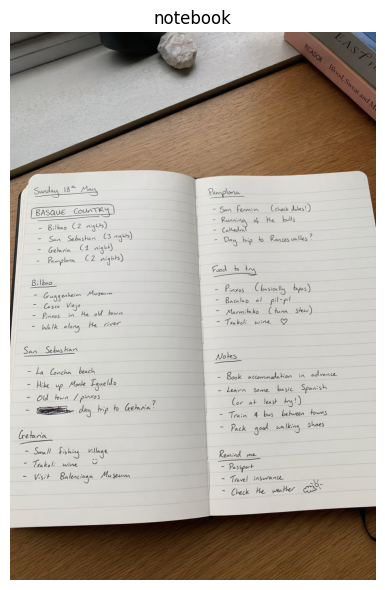

✅ Image saved in 'images/notebook_20260424_103105.png'
-rwxrwxrwx 1 root root 2.0M Apr 24 10:31 images/notebook_20260424_103105.png
🖼️ Image dimensions: (1024, 1536)


In [36]:
prompt = (
    "Amateur photo of an open notebook lying flat, filled with handwritten notes in black ballpoint pen. "
    "The handwriting is casual and slightly messy, like personnal notes, natural imperfections, crossed out words, underlined headings. "
    "Shot from slightly above, natural daylight from a window, no flash. Casual desk setting, shot on iPhone."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1536", quality="high")

display_images(images, titles=["notebook"])

image_file = save_image(images[0], prefix="notebook")
print(f"🖼️ Image dimensions: {images[0].size}")

In [37]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/notebook_20260424_103105.png

### Example 11

Prompt is: 'Create an image with 10x10 grid of objects that have the names starting with letter 'a'.'

✅ Generated 1 image(s) in 4 minutes and 39 seconds
Usage: {
  "input_tokens": 27,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 27
  },
  "output_tokens": 4534,
  "total_tokens": 4561
}


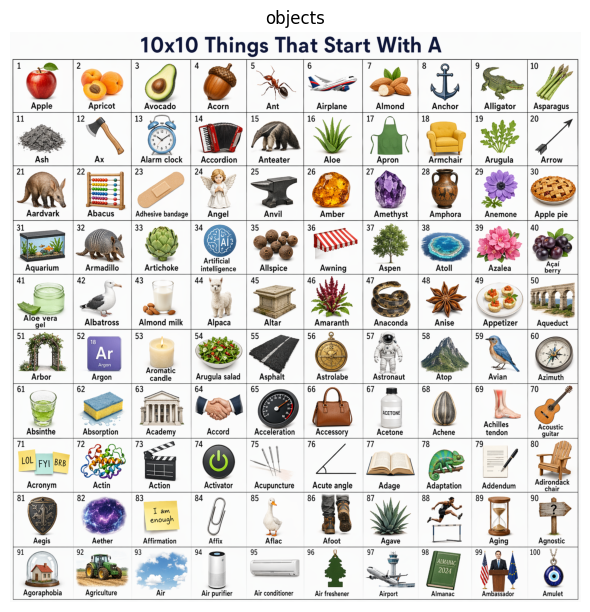

✅ Image saved in 'images/objects_20260424_103547.png'
-rwxrwxrwx 1 root root 2.4M Apr 24 10:35 images/objects_20260424_103547.png
🖼️ Image dimensions: (1536, 1536)


In [38]:
prompt = "Create an image with 10x10 grid of objects that have the names starting with letter 'a'."

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1536", quality="high")

display_images(images, titles=["objects"])

image_file = save_image(images[0], prefix="objects")
print(f"🖼️ Image dimensions: {images[0].size}")

In [39]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/objects_20260424_103547.png

### Example 12

Prompt is: 'Generate a technical diagram for photosynthesis.'

✅ Generated 1 image(s) in 4 minutes and 29 seconds
Usage: {
  "input_tokens": 14,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 14
  },
  "output_tokens": 4534,
  "total_tokens": 4548
}


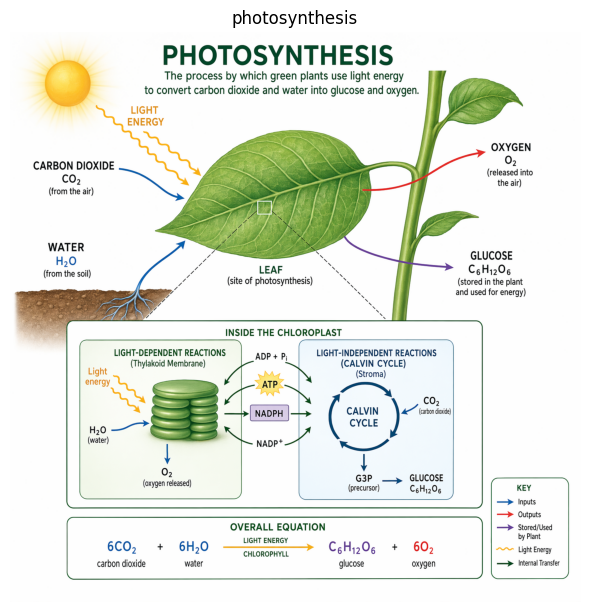

✅ Image saved in 'images/photosynthesis_20260424_104018.png'
-rwxrwxrwx 1 root root 1.4M Apr 24 10:40 images/photosynthesis_20260424_104018.png
🖼️ Image dimensions: (1536, 1536)


In [40]:
prompt = "Generate a technical diagram for photosynthesis."

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1536", quality="high")

display_images(images, titles=["photosynthesis"])

image_file = save_image(images[0], prefix="photosynthesis")
print(f"🖼️ Image dimensions: {images[0].size}")

In [41]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/photosynthesis_20260424_104018.png

### Example 13

Prompt is: 'Cuts of beef from a cow in the style of Da Vinci with labels in French.'

✅ Generated 1 image(s) in 4 minutes and 19 seconds
Usage: {
  "input_tokens": 23,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 23
  },
  "output_tokens": 4534,
  "total_tokens": 4557
}


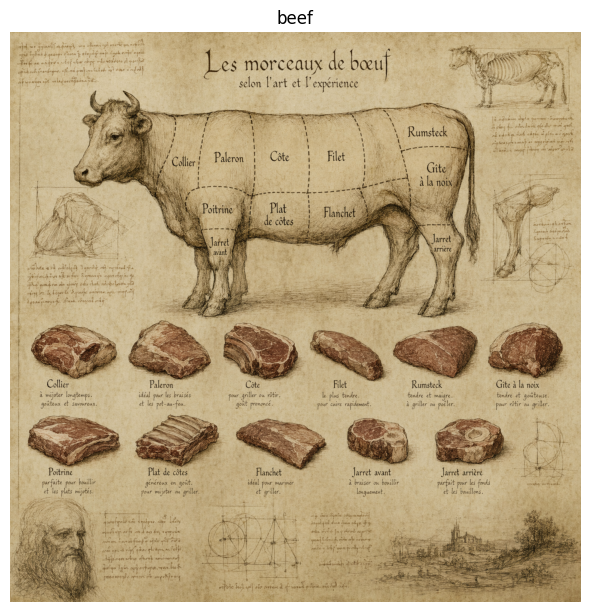

✅ Image saved in 'images/beef_20260424_104439.png'
-rwxrwxrwx 1 root root 4.2M Apr 24 10:44 images/beef_20260424_104439.png
🖼️ Image dimensions: (1536, 1536)


In [42]:
prompt = "Cuts of beef from a cow in the style of Da Vinci with labels in French."

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1536", quality="high")

display_images(images, titles=["beef"])

image_file = save_image(images[0], prefix="beef")
print(f"🖼️ Image dimensions: {images[0].size}")

In [43]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/beef_20260424_104439.png

### Example 14

Prompt is: 'Generate a detailled diagram explainer of Phi-4 14B model.'

✅ Generated 1 image(s) in 4 minutes and 40 seconds
Usage: {
  "input_tokens": 22,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 22
  },
  "output_tokens": 4534,
  "total_tokens": 4556
}


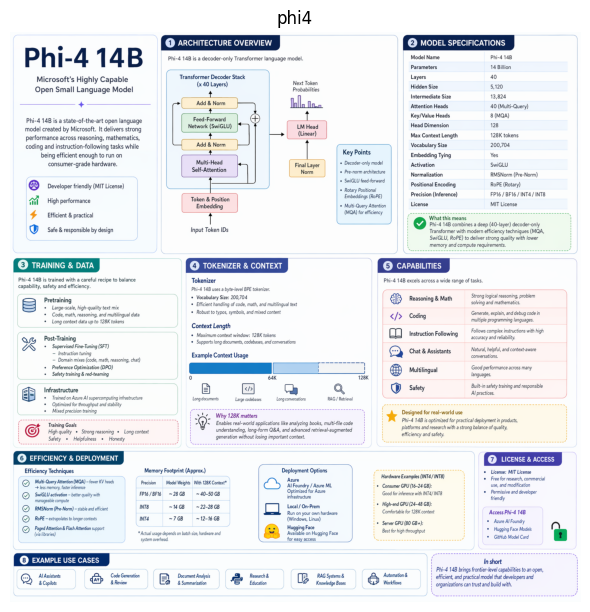

✅ Image saved in 'images/phi4_20260424_104922.png'
-rwxrwxrwx 1 root root 1.6M Apr 24 10:49 images/phi4_20260424_104922.png
🖼️ Image dimensions: (1536, 1536)


In [44]:
prompt = "Generate a detailled diagram explainer of Phi-4 14B model."

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1536", quality="high")

display_images(images, titles=["phi4"])

image_file = save_image(images[0], prefix="phi4")
print(f"🖼️ Image dimensions: {images[0].size}")

In [45]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/phi4_20260424_104922.png

### Example 15

Prompt is: 'Show the Martin Scorcese movies by year.'

✅ Generated 1 image(s) in 4 minutes and 2 seconds
Usage: {
  "input_tokens": 16,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 16
  },
  "output_tokens": 4534,
  "total_tokens": 4550
}


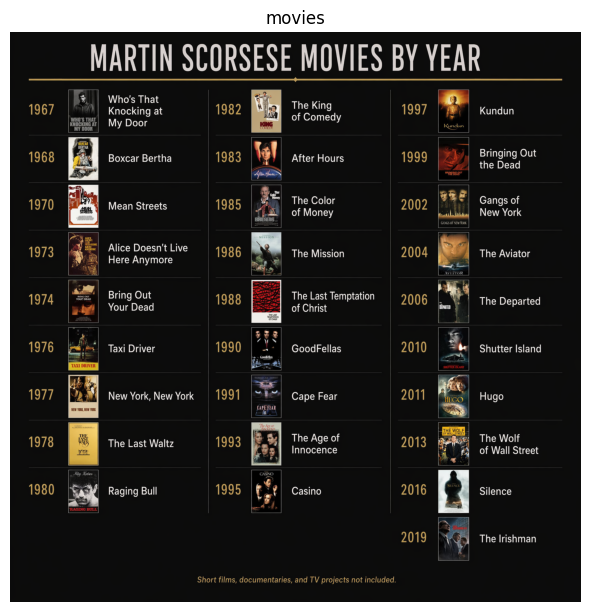

✅ Image saved in 'images/movies_20260424_111037.png'
-rwxrwxrwx 1 root root 1.3M Apr 24 11:10 images/movies_20260424_111037.png
🖼️ Image dimensions: (1536, 1536)


In [47]:
prompt = "Show the Martin Scorcese movies by year."

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1536", quality="high")

display_images(images, titles=["movies"])

image_file = save_image(images[0], prefix="movies")
print(f"🖼️ Image dimensions: {images[0].size}")

In [48]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/movies_20260424_111037.png

### Example 16

Prompt is: 'Create a clean, sell-ready product ad for a new electric vehicule 'TopEV'. Studio lighting on a soft neutral backdrop, subtle drop shadow, centered composition. Add a short tagline in the top-left in modern sans-serif: 'The best EV in 2026!'. High quality mode.'

✅ Generated 1 image(s) in 3 minutes and 60 seconds
Usage: {
  "input_tokens": 66,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 66
  },
  "output_tokens": 4534,
  "total_tokens": 4600
}


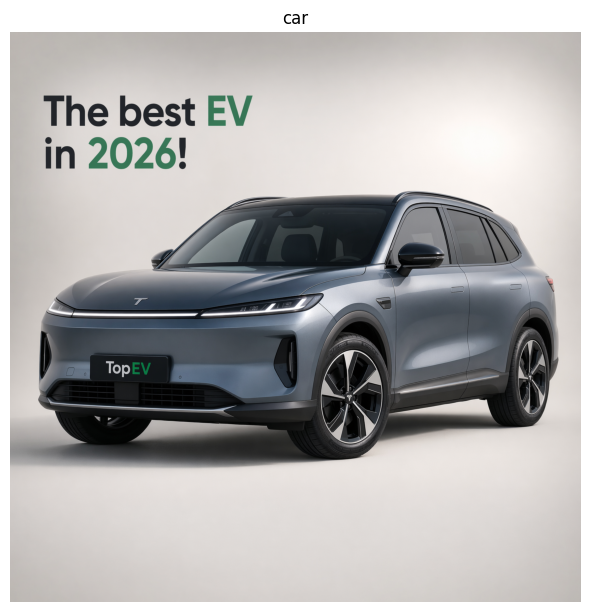

✅ Image saved in 'images/car_20260424_111505.png'
-rwxrwxrwx 1 root root 2.3M Apr 24 11:15 images/car_20260424_111505.png
🖼️ Image dimensions: (1536, 1536)


In [49]:
prompt = (
    "Create a clean, sell-ready product ad for a new electric vehicule 'TopEV'. "
    "Studio lighting on a soft neutral backdrop, subtle drop shadow, centered composition. "
    "Add a short tagline in the top-left in modern sans-serif: 'The best EV in 2026!'. "
    "High quality mode."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1536", quality="high")

display_images(images, titles=["car"])

image_file = save_image(images[0], prefix="car")
print(f"🖼️ Image dimensions: {images[0].size}")

In [50]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/car_20260424_111505.png

### Example 17

Prompt is: 'Generate an image: A realistic YouTube screenshot showing the official launch promotional video for GPT Image V2 from OpenAI's using Microsoft Foundry. Official account, with comments, 3:2 aspect ratio, 4K resolution, black color theme.'

✅ Generated 1 image(s) in 2 minutes and 56 seconds
Usage: {
  "input_tokens": 57,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 57
  },
  "output_tokens": 5546,
  "total_tokens": 5603
}


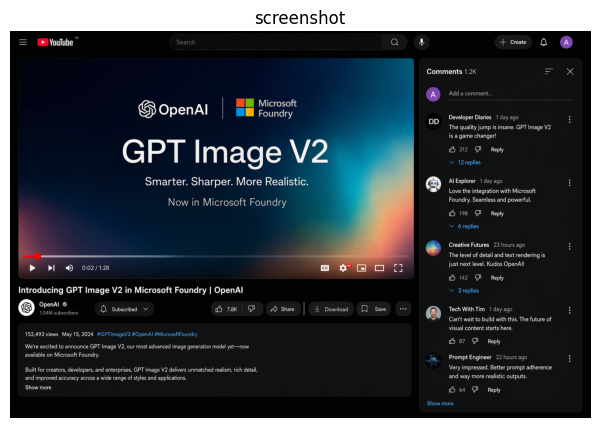

✅ Image saved in 'images/screenshot_20260424_111804.png'
-rwxrwxrwx 1 root root 867K Apr 24 11:18 images/screenshot_20260424_111804.png
🖼️ Image dimensions: (1536, 1024)


In [51]:
prompt = (
    "Generate an image: A realistic YouTube screenshot showing the official launch promotional video for GPT Image V2 "
    "from OpenAI's using Microsoft Foundry. "
    "Official account, with comments, 3:2 aspect ratio, 4K resolution, black color theme."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1536x1024", quality="high")

display_images(images, titles=["screenshot"])

image_file = save_image(images[0], prefix="screenshot")
print(f"🖼️ Image dimensions: {images[0].size}")

In [52]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/screenshot_20260424_111804.png

### Example 18

Prompt is: 'A full-body human anatomy poster titled 'Human Anatomy - Anterior View', split between muscles, bones, organs, arteries, veins, and nerves, with dense readable medical labels and a legend.'

✅ Generated 1 image(s) in 4 minutes and 35 seconds
Usage: {
  "input_tokens": 45,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 45
  },
  "output_tokens": 3171,
  "total_tokens": 3216
}


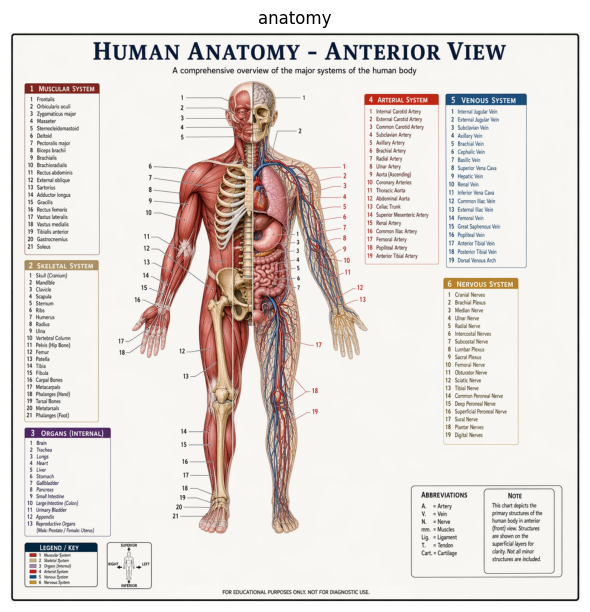

✅ Image saved in 'images/anatomy_20260424_113248.png'
-rwxrwxrwx 1 root root 910K Apr 24 11:32 images/anatomy_20260424_113248.png
🖼️ Image dimensions: (1024, 1024)


In [54]:
prompt = (
    "A full-body human anatomy poster titled 'Human Anatomy - Anterior View', split between muscles, bones, organs, arteries, "
    "veins, and nerves, with dense readable medical labels and a legend."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["anatomy"])

image_file = save_image(images[0], prefix="anatomy")
print(f"🖼️ Image dimensions: {images[0].size}")

In [55]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/anatomy_20260424_113248.png

### Example 19

Prompt is: 'Horizontal timeline infographic: 'CONTOSO Funding Rounds 2021–2026'. Seven milestones on a curved line, each with a year, round name 'Seed, Series A, Series B, Series C, Series D, Series E, Series F', amount raised in USD, and 2–3 fictional investor names in small caps. Clean white background, coral accent colour, Graphik font. Micro-footer with 'Illustrative data, not actual figures'.'

✅ Generated 1 image(s) in 4 minutes and 3 seconds
Usage: {
  "input_tokens": 100,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 100
  },
  "output_tokens": 3171,
  "total_tokens": 3271
}


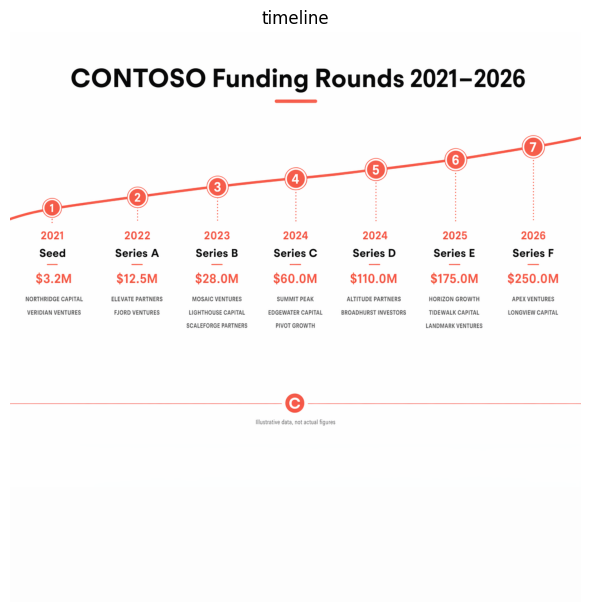

✅ Image saved in 'images/timeline_20260424_113920.png'
-rwxrwxrwx 1 root root 190K Apr 24 11:39 images/timeline_20260424_113920.png
🖼️ Image dimensions: (1024, 1024)


In [60]:
prompt = (
    "Horizontal timeline infographic: 'CONTOSO Funding Rounds 2021–2026'. Seven milestones on a curved line, each with a year, "
    "round name 'Seed, Series A, Series B, Series C, Series D, Series E, Series F', amount raised in USD, and 2–3 fictional investor "
    "names in small caps. Clean white background, coral accent colour, Graphik font. Micro-footer "
    "with 'Illustrative data, not actual figures'."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["timeline"])

image_file = save_image(images[0], prefix="timeline")
print(f"🖼️ Image dimensions: {images[0].size}")

In [61]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/timeline_20260424_113920.png

### Example 20

Prompt is: 'Hyper-realistic product shot of a wall-mounted smart-home touch panel showing a custom UI. Left column lists six rooms (Living Room, Kitchen, Bedroom 1, Bedroom 2, Bathroom, Garden), main area shows current room's controls: temperature dial at 20°C, four scene buttons (Morning, Work, Movie, Sleep), music widget with album art, and energy-usage chart 'Today: 18.2 kWh'. Display clock date time : '24th april 2026 16:10'. Matte aluminium bezel, OLED black background, cyan accent colour. Subtle room lighting reflects in the glass. Add a 'Micrrosoft' logo on the device.'

✅ Generated 1 image(s) in 3 minutes and 54 seconds
Usage: {
  "input_tokens": 146,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 146
  },
  "output_tokens": 3171,
  "total_tokens": 3317
}


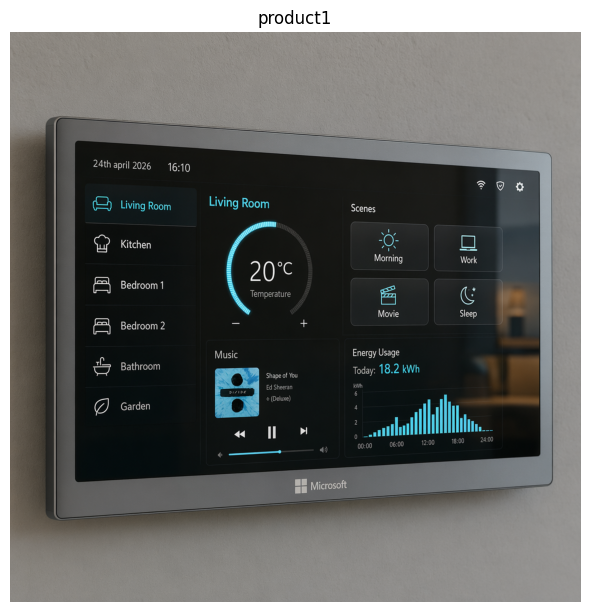

✅ Image saved in 'images/product1_20260424_115420.png'
-rwxrwxrwx 1 root root 1.2M Apr 24 11:54 images/product1_20260424_115420.png
🖼️ Image dimensions: (1024, 1024)


In [63]:
prompt = (
    "Hyper-realistic product shot of a wall-mounted smart-home touch panel showing a custom UI. "
    "Left column lists six rooms (Living Room, Kitchen, Bedroom 1, Bedroom 2, Bathroom, Garden), main area shows current room's controls: "
    "temperature dial at 20°C, four scene buttons (Morning, Work, Movie, Sleep), music widget with album art, and energy-usage "
    "chart 'Today: 18.2 kWh'. Display clock date time : '24th april 2026 16:10'. Matte aluminium bezel, OLED black background, cyan accent colour. "
    "Subtle room lighting reflects in the glass. Add a 'Micrrosoft' logo on the device."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["product1"])

image_file = save_image(images[0], prefix="product1")
print(f"🖼️ Image dimensions: {images[0].size}")

In [64]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/product1_20260424_115420.png

### Example 21

Prompt is: 'Board-meeting slide titled 'FY2025 Financial Summary'. Left half: three KPI cards ('ARR $18.4M ↑42%', 'Gross Margin 78% ↑3pp', 'Net Retention 126% ↑8pp'). Right half: quarterly revenue bar chart Q1–Q4 with trend line. Footer note 'Unaudited, management figures'. Muted slate-and-gold palette, Inter typography, corporate logomark top-left.'

✅ Generated 1 image(s) in 3 minutes and 57 seconds
Usage: {
  "input_tokens": 99,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 99
  },
  "output_tokens": 3171,
  "total_tokens": 3270
}


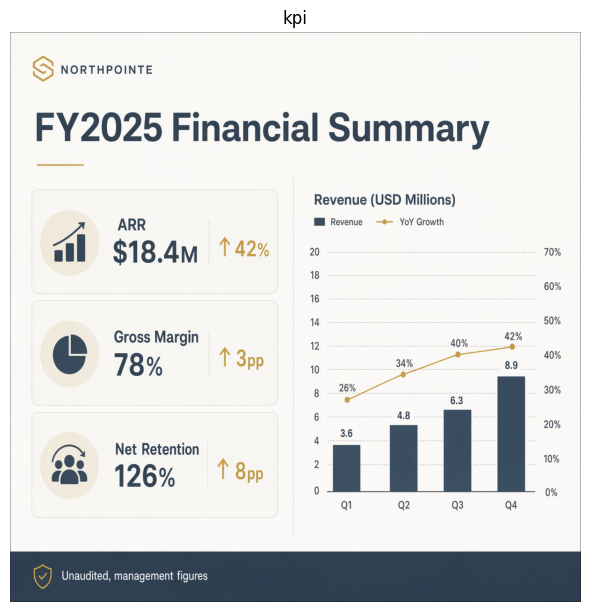

✅ Image saved in 'images/kpi_20260424_115937.png'
-rwxrwxrwx 1 root root 516K Apr 24 11:59 images/kpi_20260424_115937.png
🖼️ Image dimensions: (1024, 1024)


In [65]:
prompt = (
    "Board-meeting slide titled 'FY2025 Financial Summary'. "
    "Left half: three KPI cards ('ARR $18.4M ↑42%', 'Gross Margin 78% ↑3pp', "
    "'Net Retention 126% ↑8pp'). Right half: quarterly revenue bar chart Q1–Q4 with trend line. "
    "Footer note 'Unaudited, management figures'. Muted slate-and-gold palette, Inter typography, corporate logomark top-left."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["kpi"])

image_file = save_image(images[0], prefix="kpi")
print(f"🖼️ Image dimensions: {images[0].size}")

In [66]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/kpi_20260424_115937.png

## Example 22

Prompt is: 'Studio product photography of a minimalist skincare set on polished concrete. Three frosted-glass bottles of varying heights. Front bottle label reads 'CONTOSO // Hydrating Serum 30ml' in thin modern sans-serif. Middle bottle label reads 'CONTOSO // Night Repair 50ml'. Back bottle label reads 'CONTOSO // Daily Toner 100ml'. A small card behind them shows a QR code and the text 'CONTOSO.co' and a manuscript text written in blue saying 'Thank you Serge!'. Soft north-window lighting, eucalyptus sprig, luxury beauty aesthetic, sharp label legibility, clean negative space.'

✅ Generated 1 image(s) in 3 minutes and 54 seconds
Usage: {
  "input_tokens": 135,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 135
  },
  "output_tokens": 3171,
  "total_tokens": 3306
}


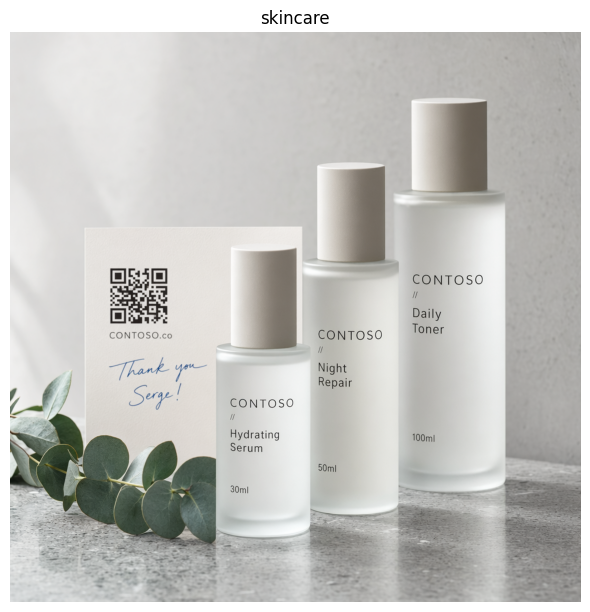

✅ Image saved in 'images/skincare_20260424_121801.png'
-rwxrwxrwx 1 root root 1.1M Apr 24 12:18 images/skincare_20260424_121801.png
🖼️ Image dimensions: (1024, 1024)


In [70]:
prompt = (
    "Studio product photography of a minimalist skincare set on polished concrete. Three frosted-glass bottles of varying heights. "
    "Front bottle label reads 'CONTOSO // Hydrating Serum 30ml' in thin modern sans-serif. Middle bottle label reads "
    "'CONTOSO // Night Repair 50ml'. Back bottle label reads 'CONTOSO // Daily Toner 100ml'. "
    "A small card behind them shows a QR code and the text 'CONTOSO.co' and a manuscript text written in blue saying 'Thank you Serge!'. "
    "Soft north-window lighting, eucalyptus sprig, luxury beauty aesthetic, sharp label legibility, clean negative space."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["skincare"])

image_file = save_image(images[0], prefix="skincare")
print(f"🖼️ Image dimensions: {images[0].size}")

In [71]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/skincare_20260424_121801.png

## Example 23

Prompt is: 'A photorealistic editorial photograph of a rainy 1970s Manhattan street at dusk, yellow cabs reflected in wet asphalt, neon diner sign reading 'CONTOSO COFFEE SHOP' in warm tungsten, a man in a wool trench coat reading a newspaper at the curb. Kodak Portra color palette, accurate wet-surface physics, believable tungsten-vs-neon color mixing, 35mm grain, shallow depth of field.'

✅ Generated 1 image(s) in 3 minutes and 59 seconds
Usage: {
  "input_tokens": 95,
  "input_tokens_details": {
    "image_tokens": 0,
    "text_tokens": 95
  },
  "output_tokens": 3171,
  "total_tokens": 3266
}


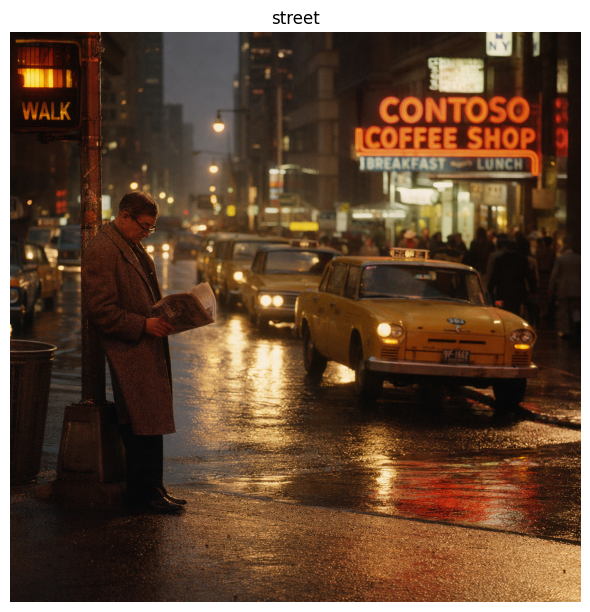

✅ Image saved in 'images/street_20260424_122202.png'
-rwxrwxrwx 1 root root 1.8M Apr 24 12:22 images/street_20260424_122202.png
🖼️ Image dimensions: (1024, 1024)


In [72]:
prompt = (
    "A photorealistic editorial photograph of a rainy 1970s Manhattan street at dusk, yellow cabs reflected in wet asphalt, neon diner sign "
    "reading 'CONTOSO COFFEE SHOP' in warm tungsten, a man in a wool trench coat reading a newspaper at the curb. "
    "Kodak Portra color palette, accurate wet-surface physics, believable tungsten-vs-neon color mixing, 35mm grain, shallow depth of field."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["street"])

image_file = save_image(images[0], prefix="street")
print(f"🖼️ Image dimensions: {images[0].size}")

In [73]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/street_20260424_122202.png

## Example 24

Prompt is: 'A photorealistic interior scene of a French 'La Poste' post office branch in France during a busy weekday morning. Wide-angle composition showing the customer service area with three service counters along the back wall, each staffed by a postal employee (guichetier) wearing the official La Poste uniform — navy blue polo shirt with the yellow 'La Poste' logo embroidered on the chest. Five to six customers are visible: an elderly woman holding a small parcel at one counter, a young professional in business attire paying at another, a mother with a child waiting in line near the automatic ticket dispenser, and a delivery man in yellow-and-blue La Poste vest picking up a stack of registered letters. The queue is organized by a retractable belt stanchion system. Environmental details: the iconic La Poste yellow ('jaune La Poste', Pantone 116 C) accent walls and signage, digital queue-number display above the counters showing ticket numbers, yellow drop box for mail on the side 

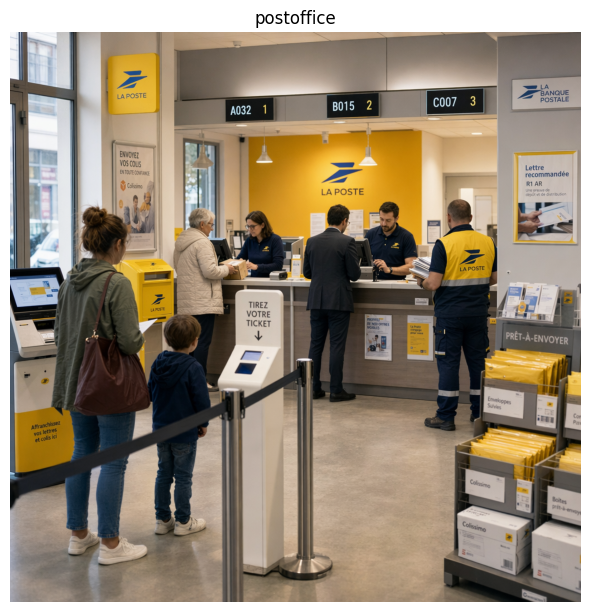

✅ Image saved in 'images/postoffice_20260424_123046.png'
-rwxrwxrwx 1 root root 1.4M Apr 24 12:30 images/postoffice_20260424_123046.png
🖼️ Image dimensions: (1024, 1024)


In [75]:
prompt = (
    "A photorealistic interior scene of a French 'La Poste' post office branch in France during a busy weekday morning. "
    "Wide-angle composition showing the customer service area with three service counters along the back wall, each staffed "
    "by a postal employee (guichetier) wearing the official La Poste uniform — navy blue polo shirt with the yellow 'La Poste' "
    "logo embroidered on the chest. "
    "Five to six customers are visible: an elderly woman holding a small parcel at one counter, a young professional "
    "in business attire paying at another, a mother with a child waiting in line near the automatic ticket dispenser, "
    "and a delivery man in yellow-and-blue La Poste vest picking up a stack of registered letters. "
    "The queue is organized by a retractable belt stanchion system. "
    "Environmental details: the iconic La Poste yellow ('jaune La Poste', Pantone 116 C) accent walls and signage, digital "
    "queue-number display above the counters showing ticket numbers, yellow drop box for mail on the side wall, self-service "
    "kiosks for stamps and package weighing, promotional posters for Colissimo and Lettre Recommandée services, a rack of padded "
    "envelopes and shipping boxes, and a visible Banque Postale corner. Flooring is light gray polished concrete; ceiling has "
    "recessed LED lighting with large front windows letting in soft natural daylight. "
    "Style: realistic documentary photography, 35mm lens, shallow depth of field focused on mid-ground, warm natural color grading, "
    "candid atmosphere, shot at eye level. Aspect ratio 16:9."
)

print(f"Prompt is: '{prompt}'\n")
images, raw = generate_image(prompt, size="1024x1024", quality="high")

display_images(images, titles=["postoffice"])

image_file = save_image(images[0], prefix="postoffice")
print(f"🖼️ Image dimensions: {images[0].size}")

In [76]:
image_link = FileLink(path=image_file)
image_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow1/code/Users/seretkow/gptimage2/images/postoffice_20260424_123046.png

### All images

In [77]:
!ls $OUTPUT_DIR -lh

total 43M
-rwxrwxrwx 1 root root 910K Apr 24 11:32 anatomy_20260424_113248.png
-rwxrwxrwx 1 root root 4.2M Apr 24 10:44 beef_20260424_104439.png
-rwxrwxrwx 1 root root 2.3M Apr 24 11:15 car_20260424_111505.png
-rwxrwxrwx 1 root root 1.8M Apr 24 10:24 flowchart_20260424_102447.png
-rwxrwxrwx 1 root root 516K Apr 24 11:59 kpi_20260424_115937.png
-rwxrwxrwx 1 root root 3.4M Apr 24 10:10 manga_20260424_101011.png
-rwxrwxrwx 1 root root 1.3M Apr 24 11:10 movies_20260424_111037.png
-rwxrwxrwx 1 root root 2.0M Apr 24 10:31 notebook_20260424_103105.png
-rwxrwxrwx 1 root root 2.4M Apr 24 10:21 notredamedeparis_20260424_102144.png
-rwxrwxrwx 1 root root 2.4M Apr 24 10:35 objects_20260424_103547.png
-rwxrwxrwx 1 root root 1.7M Apr 24 10:05 opera_20260424_100548.png
-rwxrwxrwx 1 root root 1.8M Apr 24 10:18 palm_20260424_101822.png
-rwxrwxrwx 1 root root 125K Apr 24 10:13 person_20260424_101307.jpeg
-rwxrwxrwx 1 root root 1.6M Apr 24 10:49 phi4_20260424_104922.png
-rwxrwxrwx 1 root root 1.5M Apr 24